In [3]:
import numpy as np
import cv2

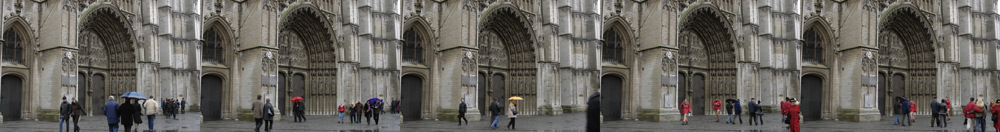

In [22]:
from pathlib import Path
import numpy as np
import cv2
from PIL import Image


def imshow(a):
  a = a.clip(0, 255).astype('uint8')
  if a.ndim == 3:
    if a.shape[2] == 4:
      a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
    else:
      a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
  display(Image.fromarray(a.astype('uint8')))


def display_images(path):
    images = []
    path = Path(path)
    for img in path.glob('*.jpg'):
        images.append(cv2.imread(str(img)))
    imshow(np.concatenate(images, axis=1))

display_images('cathedral/')

In [5]:
image = cv2.imread("cathedral/d001.jpg")
image2 = cv2.imread('cathedral/d002.jpg')
image3 = cv2.imread('cathedral/d003.jpg')
image4 = cv2.imread('cathedral/d004.jpg')
image5 = cv2.imread('cathedral/d005.jpg')

photos = np.array([image, image2, image3, image4, image5])

In [6]:
image.shape == image2.shape == image3.shape == image4.shape == image5.shape

True

In [7]:
image.shape

(500, 752, 3)

In [8]:
gray_photos = np.array([cv2.cvtColor(photo, cv2.COLOR_BGR2GRAY) for photo in photos])
hsv_photos = np.array([cv2.cvtColor(photo, cv2.COLOR_BGR2HSV) for photo in photos])

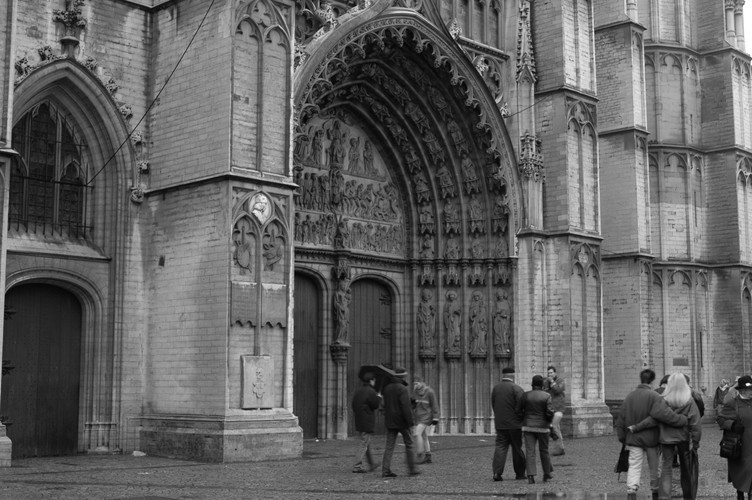

In [9]:
imshow(gray_photos[1])

In [10]:
# maximum - najczesciej wystepujacy piksel
# mozemy badac 3 kanaly - czyli najczesciej wystepujacy r, g oraz b i z nich tworzyc piksel
def maximum_likelihood(photos):
    # photos.shape = (5, 500, 752, 3)
    counts = np.bincount(photos)
    np.argmax(counts)
    # input: rgb, 3 kanaly. piksele mozna porownywac calosciowo, czyli usredniajac 3 kanaly
    # albo mozna porownywac kanaly w ramach jednego piksela
    pass

def minimum_likelihood():
    pass
def median_likelihood():
    pass
def avg_likelihood():
    pass

-----------------------------------

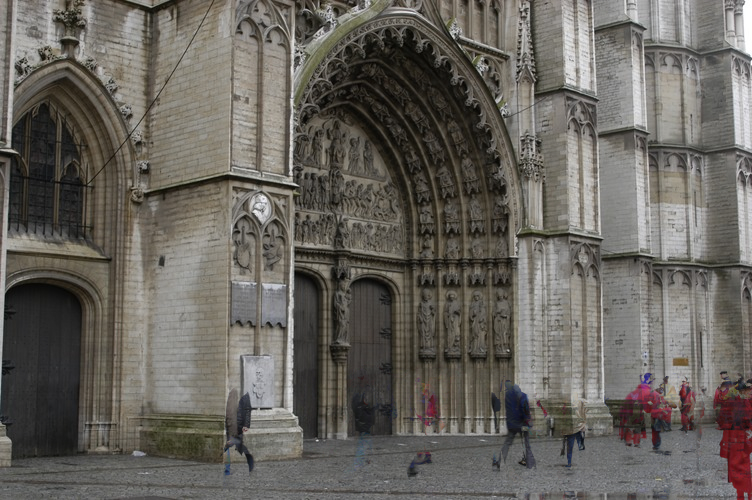

In [11]:
imshow(np.median(photos, axis=0))

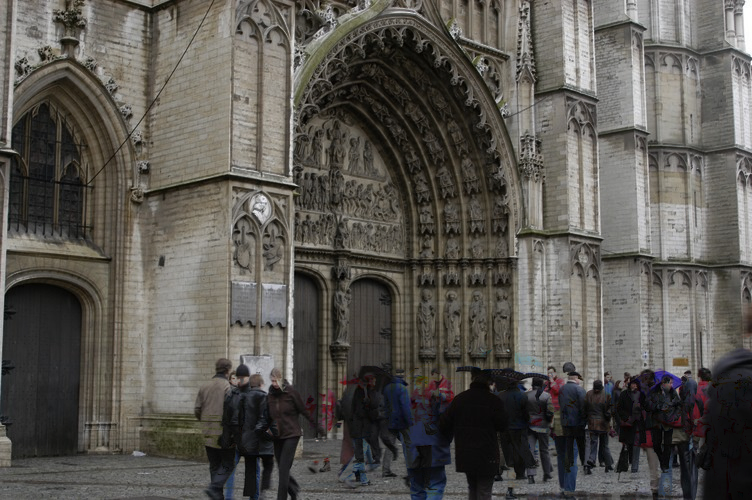

In [12]:
imshow(np.min(photos, axis=0))

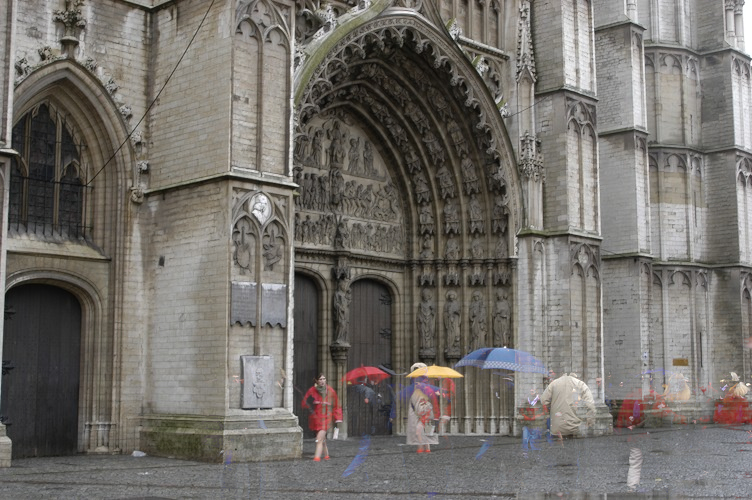

In [13]:
imshow(np.max(photos, axis=0))

In [42]:
!pip install Counter

  Preparing metadata (setup.py) ... done
  Created wheel for Counter: filename=Counter-1.0.0-py3-none-any.whl size=5394 sha256=cdfe93dd04f113357ac97d978c889fa4aa1bc8f38489d12820ea09d8c3766737
  Stored in directory: /Users/admin/Library/Caches/pip/wheels/08/5b/a0/8f15503db6a45a1d8747bf0f1438411cb37484ac4dfdfe6c0b
Successfully built Counter


(5, 500, 752)
(5, 500, 752)
(5, 500, 752)
(5, 500, 752)
(5, 500, 752)
(5, 500, 752)
(5, 500, 752)
(5, 500, 752)
(5, 500, 752, 3)
(5, 500, 752, 3)


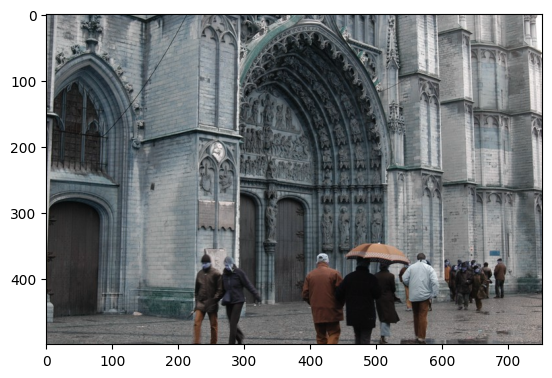

In [39]:
import numpy as np
from scipy.ndimage import convolve
from matplotlib import pyplot as plt

def erase_people(photos, neighborhood_size=3):
    photos_copy = photos.copy()
    # Compute the maximum pixel values across all images for each pixel position
    max_image = np.max(photos, axis=0)
    print(max_image)
    
    # Calculate the Euclidean distance between each pixel in each image and the corresponding pixel in the maximum image
    distances = np.sqrt(np.sum((photos_copy - max_image)**2, axis=-1))
    print(distances.shape)
    
    # Find the indices of pixels where the color differs significantly from the background
    erase_indices = distances > 30  # Adjust the threshold as needed
    print(erase_indices.shape)
    
    # Create a kernel for local neighborhood mean calculation
    kernel = np.ones((5, neighborhood_size, neighborhood_size)) / (neighborhood_size ** 2)
    
    # Iterate over the channels and apply the mean of local neighborhood to the erased pixels
    for i in range(photos.shape[-1]):
        channel = photos_copy[..., i]
        print(channel.shape)
        mean_channel = convolve(channel.astype(float), kernel, mode='constant')
        print(mean_channel.shape)
        mean_channel = mean_channel.astype(np.uint8)
        
        # Replace erased pixels with mean of local neighborhood
        channel[erase_indices] = mean_channel[erase_indices]
    
    return photos_copy

# Example usage:
erased_images = erase_people(photos)
print(erased_images.shape)
print(photos.shape)
# imshow(erased_images)
plt.imshow(erased_images[4])

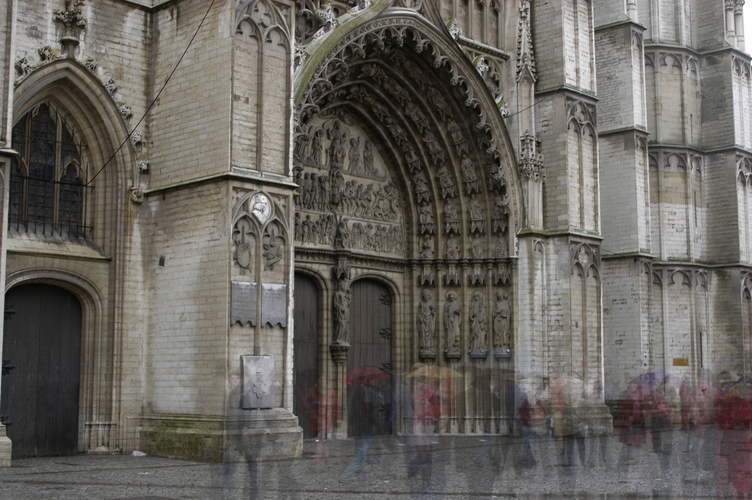

In [33]:
imshow(np.mean(photos, axis=0))

In [ ]:
how_many = 0
for i in range(500):
    for j in range(725):
        if photos[1][i][j][0] == photos[0][i][j][0] == photos[2][i][j][0] == photos[3][i][j][0] == photos[4][i][j][0]:
            how_many += 1

print(how_many)

print(photos[0, ..., 0] - photos[1, ..., 0]) # ZDJECIA SA ROZNE, COS PIEKNEGO

Most frequent RGB value shape: (500, 725, 3)


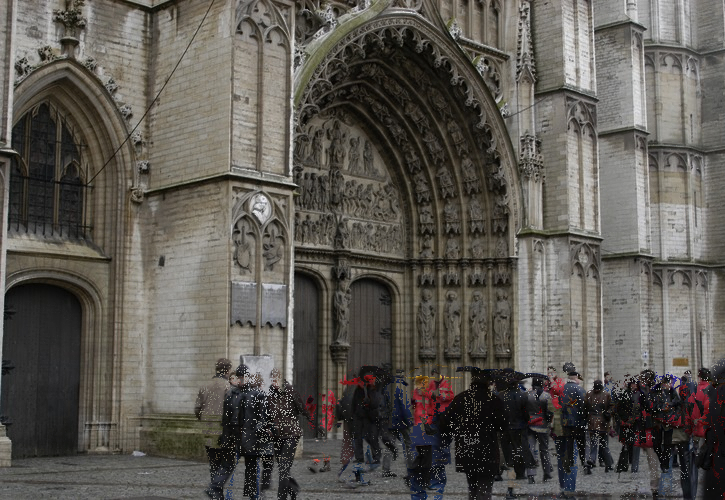

In [34]:
# dziala slabo poniewaz - zgodnie z powyzsza komorka - tlo, ktore staramy sie wyekstrahowac nie jest wcale takie samo na kazdej fotce
# (czego sie dalo domyslic), dlatego 

def most_frequent_value(photos): # (5, 500, 725, 3)
    stack_photos = photos
    
    # piksele na wierszach
    stack_pixels = stack_photos.reshape(-1, 3)
    most_frequent_pixel = np.zeros((500, 725, 3), dtype=np.uint8)
    
    for i in range(500):
        for j in range(725):
            # wyjmij wartości RGB na pozycji (i,j) na wszystkich fotkach
            pixel_values = stack_photos[:, i, j, :]
            
            unique_pixels, counts = np.unique(pixel_values, axis=0, return_counts=True)
            
            # znajdź indeks najczęstszej wartości i przypisz
            most_frequent_index = np.argmax(counts)
            most_frequent_pixel[i, j] = unique_pixels[most_frequent_index]
    
    print("Most frequent RGB value shape:", most_frequent_pixel.shape)
    return most_frequent_pixel

imshow(most_frequent_value(photos))

Most similar RGB value shape: (500, 752, 3)


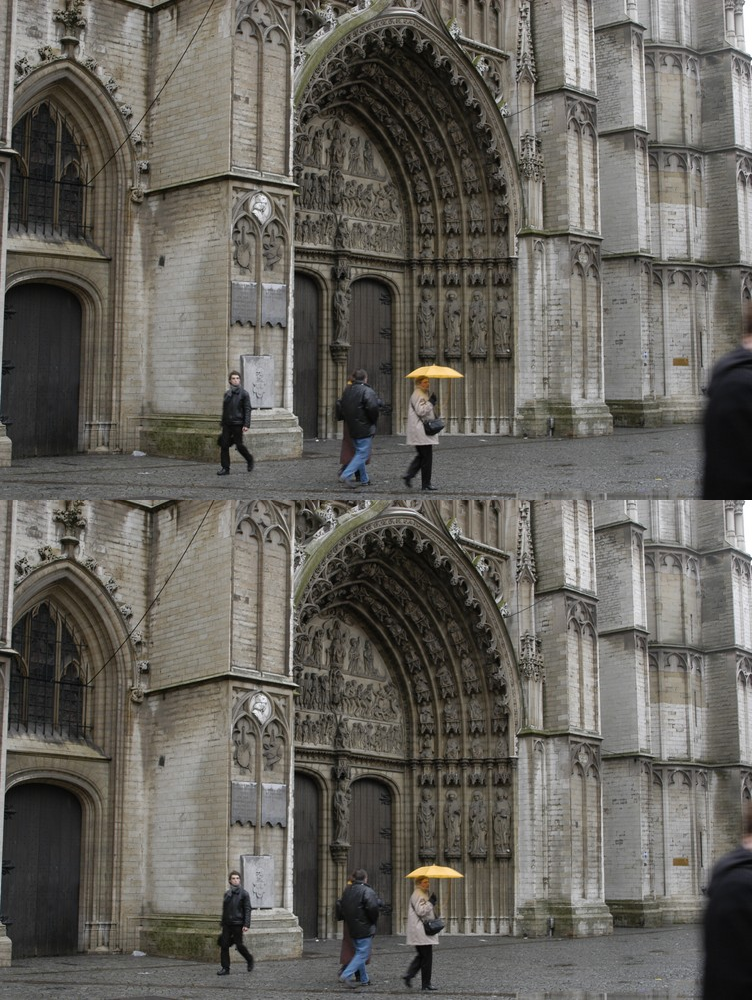

In [35]:
def most_similar_pixel(photos):
    num_photos, num_rows, num_cols, _ = photos.shape
    
    # Reshape photos to a 2D array where each row represents a pixel's RGB values
    stack_pixels = photos.reshape(-1, 3)
    
    most_similar_pixel = np.zeros((num_rows, num_cols, 3), dtype=np.uint8)
    
    for i in range(num_rows):
        for j in range(num_cols):
            # Extract pixel values at position (i, j) from all photos
            pixel_values = photos[:, i, j, :]
            
            # Calculate the squared differences between each pixel and other pixels at the same position
            squared_diffs = np.sum((pixel_values - pixel_values[0])**2, axis=1)
            
            # Find the index of the minimum squared difference
            min_index = np.argmin(squared_diffs)
            
            # Assign the pixel value with the lowest squared difference
            most_similar_pixel[i, j] = pixel_values[min_index]
    
    print("Most similar RGB value shape:", most_similar_pixel.shape)
    
    return most_similar_pixel

# Assuming imshow function is defined elsewhere
imshow(np.concatenate([most_similar_pixel(photos), photos[0]]))



Most similar RGB value shape: (500, 752, 3)


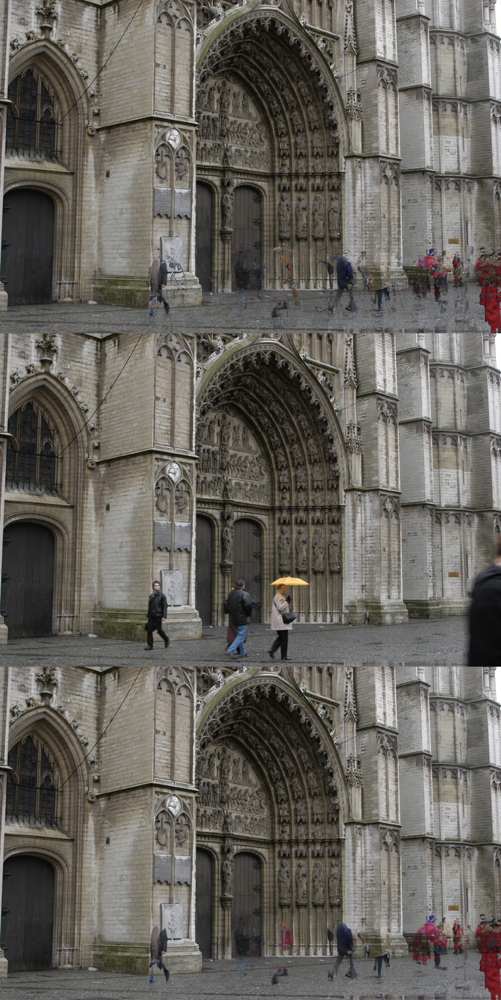

In [37]:
def most_similar_pixel(photos):
    num_photos, num_rows, num_cols, _ = photos.shape
    
    # Reshape photos to a 2D array where each row represents a pixel's RGB values
    stack_pixels = photos.reshape(-1, 3)
    
    most_similar_pixel = np.zeros((num_rows, num_cols, 3), dtype=np.uint8)
    
    for i in range(num_rows):
        for j in range(num_cols):
            # Extract pixel values at position (i, j) from all photos
            pixel_values = photos[:, i, j, :]
            
            # Calculate the squared differences between each pixel and other pixels at the same position
            squared_diffs = np.sum((pixel_values - np.mean(pixel_values, axis=0))**2, axis=1)
            
            # Find the index of the minimum squared difference
            min_index = np.argmin(squared_diffs)
            
            # Assign the pixel value with the lowest squared difference
            most_similar_pixel[i, j] = pixel_values[min_index]
    
    print("Most similar RGB value shape:", most_similar_pixel.shape)
    
    return most_similar_pixel

imshow(np.concatenate([most_similar_pixel(photos), photos[0], np.median(photos, axis=0)]))

Most similar RGB value shape: (500, 752, 3)


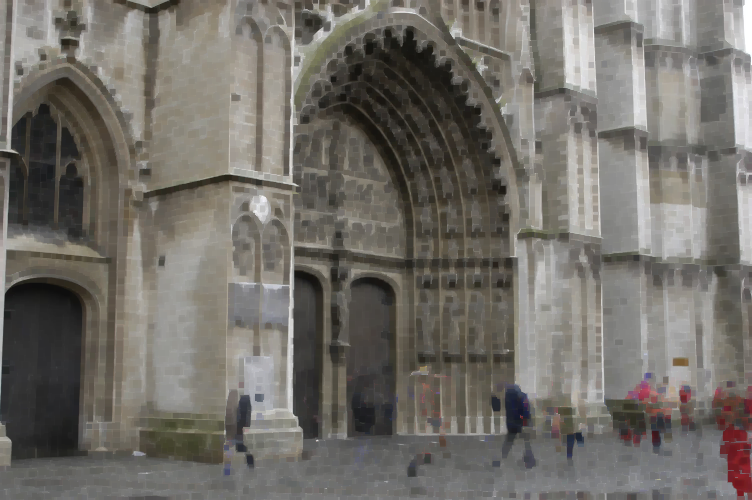

In [46]:
import cv2

def erase_imperfections(image):
    kernel_size = (5, 5)  # Adjust the kernel size as needed
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    closed_image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    return closed_image

erased_image = erase_imperfections(most_similar_pixel(photos))
imshow(erased_image)

In [ ]:
import numpy as np

def erase_people(photos):
    num_photos, num_rows, num_cols, _ = photos.shape
    
    # Reshape photos to a 2D array where each row represents a pixel's RGB values
    stack_pixels = photos.reshape(-1, num_photos, 3)
    
    # Calculate the mean pixel value across all images
    mean_pixel = np.mean(stack_pixels, axis=1)
    
    # Calculate the variance of pixel values across all images
    pixel_variance = np.var(stack_pixels, axis=1)
    
    # Threshold the variance to focus on pixels with low variance
    threshold = np.percentile(pixel_variance, 25, axis=0)
    low_variance_pixels = pixel_variance < threshold[:, None, None]
    
    # Apply the boolean mask to each channel of the pixel values
    low_variance_pixels = np.all(low_variance_pixels, axis=0)
    
    # Find the mean pixel value for the low variance pixels
    background_pixel = np.mean(stack_pixels[:, low_variance_pixels], axis=1)
    
    # Reshape the background pixel value to match the image dimensions
    background_image = np.tile(background_pixel, (num_rows * num_cols, 1)).reshape((num_rows, num_cols, 3))
    
    return background_image.astype(np.uint8)

# Assuming imshow function is defined elsewhere
imshow(erase_people(photos))


In [ ]:
def most_similar_value(photos): # (5, 500, 725, 3)
    stack_photos = photos
    
    # piksele na wierszach
    stack_pixels = stack_photos.reshape(-1, 3)
    most_frequent_pixel = np.zeros((500, 725, 3), dtype=np.uint8)
    
    for i in range(500):
        for j in range(725):
            # wyjmij wartości RGB na pozycji (i,j) na wszystkich fotkach
            pixel_values = stack_photos[:, i, j, :]
            
            # zlicz unikalne wartości RGB
            unique_pixels, counts = np.unique(pixel_values, axis=0, return_counts=True)
            print(unique_pixels, counts)
            
            # znajdź indeks najczęstszej wartości i przypisz
            most_frequent_index = np.argmax(counts)
            most_frequent_pixel[i, j] = unique_pixels[most_frequent_index]
    
    print("Most frequent RGB value shape:", most_frequent_pixel.shape)
    return most_frequent_pixel

imshow(most_similar_value(photos))

In [ ]:
# UDOSKONALENIE: jeżeli najczęściej występujący piksel sobie nie radzi, to znajdźmy najmniej różniącego się od wszystkich innych

In [ ]:
def maximum_likelihood(photos):
    avg = np.mean(photos, axis=0) # odchylenie standardowe miedzy pikselami obrazow
    # std = np.array([std for _ in range(5)])
    print(avg.shape) # (500, 725, 3)

    # mam 5 zdjec
    # mam M = tablice srednich 3 kanalow pomiedzy 5 zdjeciami
    # dla kazdego piksela znalezc indeks zdjecia, 
    # dla ktorego suma roznic miedzy pikselami 3 kanalow, a odpowiadajaca im srednia z tablicy M jest najmniejsza

    np.sum(
    np.subtract(photos[...,::1]})
        
    print(avg.shape)
    
    # min_distance = 1000000000
    # for photo in photos:
    #     distance = photo - std
    #     if min_distance > distance:
    #         min_distance = distance
    #         # argmin of those pixels
            

maximum_likelihood(photos)

In [ ]:
avg = np.mean(photos, axis=0)

In [ ]:
for photo in photos[...,::1]:
    print(np.subtract(photo, avg).shape)